# PROJECT PHASE 1 and 2

##### MEMBER 1
NAME: MADHURI VADYALA

UBID: mvadyala

Email: mvadyala@buffalo.edu

##### MEMBER 2
NAME: MADHUMITHA VURIBINDI

UBID: mvuribin

Email: mvuribin@buffalo.edu


## Libraries required for Phase 1

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
import warnings
warnings.simplefilter(action='ignore')

## PHASE 1 - DATA CLEANING AND EDA

In [3]:
#dataset loading - Crop Recommendation Dataset
crop_yield = pd.read_csv("crop_yield_dataset.csv")
crop_dataframe = pd.DataFrame(crop_yield)


In [4]:
#BASIC INFO OF THE DATASET
crop_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28242 entries, 0 to 28241
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Serial                         28242 non-null  int64  
 1   Area                           28242 non-null  object 
 2   Item                           28242 non-null  object 
 3   Year                           28242 non-null  int64  
 4   hg/ha_yield                    28242 non-null  int64  
 5   average_rain_fall_mm_per_year  28242 non-null  int64  
 6   pesticides_tonnes              28242 non-null  float64
 7   avg_temp                       28242 non-null  float64
dtypes: float64(2), int64(4), object(2)
memory usage: 1.7+ MB


In [5]:
#FIRST 5 ROWS OF THE DATASET
crop_dataframe.head()

,Serial,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485,121.0,16.37
1,1,Albania,Potatoes,1990,66667,1485,121.0,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485,121.0,16.37
3,3,Albania,Sorghum,1990,12500,1485,121.0,16.37
4,4,Albania,Soybeans,1990,7000,1485,121.0,16.37


In [6]:
#LAST 5 ROWS OF THE DATASET
crop_dataframe.tail()

,Serial,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
28237,28237,Zimbabwe,"Rice, paddy",2013,22581,657,2550.07,19.76
28238,28238,Zimbabwe,Sorghum,2013,3066,657,2550.07,19.76
28239,28239,Zimbabwe,Soybeans,2013,13142,657,2550.07,19.76
28240,28240,Zimbabwe,Sweet potatoes,2013,22222,657,2550.07,19.76
28241,28241,Zimbabwe,Wheat,2013,22888,657,2550.07,19.76


In [7]:
#DESCRIPTION OF THE DATASET - VARIOUS BASIC INFORMATION
crop_dataframe.describe()

,Serial,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
count,28242.000000,28242.000000,28242.000000,28242.00000,28242.000000,28242.000000
mean,14120.500000,2001.544296,77053.332094,1149.05598,37076.909344,20.542627
std,8152.907488,7.051905,84956.612897,709.81215,59958.784665,6.312051
min,0.000000,1990.000000,50.000000,51.00000,0.040000,1.300000
25%,7060.250000,1995.000000,19919.250000,593.00000,1702.000000,16.702500
50%,14120.500000,2001.000000,38295.000000,1083.00000,17529.440000,21.510000
75%,21180.750000,2008.000000,104676.750000,1668.00000,48687.880000,26.000000
max,28241.000000,2013.000000,501412.000000,3240.00000,367778.000000,30.650000


In [8]:
#SHAPE OF THE DATAFRAMEAY
crop_dataframe.shape

(28242, 8)

In [9]:
#COLUMN NAMES OF THE DATASET
crop_dataframe.columns.values

array(['Serial', 'Area', 'Item', 'Year', 'hg/ha_yield',
       'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp'],
      dtype=object)

In [10]:
#UNIQUE VALUES IN DATASET
crop_dataframe.nunique()

Serial                           28242
Area                               101
Item                                10
Year                                23
hg/ha_yield                      11514
average_rain_fall_mm_per_year      100
pesticides_tonnes                 1673
avg_temp                          1831
dtype: int64

<AxesSubplot: >

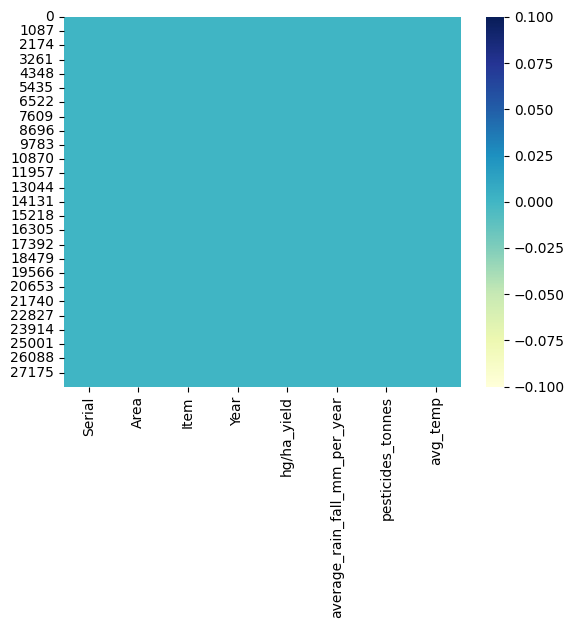

In [11]:
#CHECKING IF DATASET HAS NULL VALUES
sns.heatmap(crop_dataframe.isnull(),cbar=True,cmap = 'YlGnBu')#no missing values

In [12]:
crop_dataframe.isna().sum()

Serial                           0
Area                             0
Item                             0
Year                             0
hg/ha_yield                      0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
dtype: int64

In [13]:
#DROPPING A COLUMN
crop_dataframe = crop_dataframe.drop(columns='Serial')

In [14]:
crop_dataframe.shape

(28242, 7)

In [15]:
#CHECKING FOR OBJECT DATATYPE IN THE DATASET
crop_dataframe.columns[crop_dataframe.dtypes=='object']

Index(['Area', 'Item'], dtype='object')

In [16]:
#CHECKING FOR THE DUPLICATE VALUES IN A DATASET
crop_dataframe.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
28237    False
28238    False
28239    False
28240    False
28241    False
Length: 28242, dtype: bool

In [17]:
crop_dataframe.duplicated().sum()

2310

In [18]:
crop_dataframe = crop_dataframe.drop_duplicates()
crop_dataframe = crop_dataframe.reset_index()
crop_dataframe

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485,121.00,16.37
1,1,Albania,Potatoes,1990,66667,1485,121.00,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485,121.00,16.37
3,3,Albania,Sorghum,1990,12500,1485,121.00,16.37
4,4,Albania,Soybeans,1990,7000,1485,121.00,16.37
...,...,...,...,...,...,...,...,...
25927,28237,Zimbabwe,"Rice, paddy",2013,22581,657,2550.07,19.76
25928,28238,Zimbabwe,Sorghum,2013,3066,657,2550.07,19.76
25929,28239,Zimbabwe,Soybeans,2013,13142,657,2550.07,19.76
25930,28240,Zimbabwe,Sweet potatoes,2013,22222,657,2550.07,19.76


###### SETTING PRECISION FOR COLUMNS

In [19]:
crop_dataframe['avg_temp'].round(decimals=2)

0        16.37
1        16.37
2        16.37
3        16.37
4        16.37
         ...  
25927    19.76
25928    19.76
25929    19.76
25930    19.76
25931    19.76
Name: avg_temp, Length: 25932, dtype: float64

In [20]:
crop_dataframe['pesticides_tonnes'].round(decimals=2)

0         121.00
1         121.00
2         121.00
3         121.00
4         121.00
          ...   
25927    2550.07
25928    2550.07
25929    2550.07
25930    2550.07
25931    2550.07
Name: pesticides_tonnes, Length: 25932, dtype: float64

In [21]:
crop_dataframe['average_rain_fall_mm_per_year'].round(decimals=2)


0        1485
1        1485
2        1485
3        1485
4        1485
         ... 
25927     657
25928     657
25929     657
25930     657
25931     657
Name: average_rain_fall_mm_per_year, Length: 25932, dtype: int64

###### STATISTICS OF EACH COLUMN - MEAN, MEDIAN, STD, MINIMUM VALUE, MAXIMUM VALUE, VARIANCE

In [22]:
#FOR HG/HA_YIELD COLUMN
def statistics(numerical_column):
    mean = crop_dataframe[numerical_column].mean()
    median = crop_dataframe[numerical_column].median()
    std = crop_dataframe[numerical_column].std()
    minimum = crop_dataframe[numerical_column].min()
    maximum = crop_dataframe[numerical_column].max()
    var = crop_dataframe[numerical_column].var()
    print("Mean    :",mean)
    print("Median  :",median)
    print("Std     :",std)
    print("Min     :",minimum)
    print("Max     :",maximum)
    print("Variance:{}",var)
    print("*******************************************")

In [23]:
numerical_columns = ["Year","hg/ha_yield","average_rain_fall_mm_per_year","pesticides_tonnes","avg_temp"]
for x in numerical_columns:
    print("STATISTICS OF ",x)
    statistics(x)
    

STATISTICS OF  Year
Mean    : 2001.5564553447477
Median  : 2001.0
Std     : 7.055923827614378
Min     : 1990
Max     : 2013
Variance:{} 49.78606106109633
*******************************************
STATISTICS OF  hg/ha_yield
Mean    : 76978.13292457195
Median  : 39530.0
Std     : 84647.60555241953
Min     : 50
Max     : 501412
Variance:{} 7165217125.758004
*******************************************
STATISTICS OF  average_rain_fall_mm_per_year
Mean    : 1146.8366882616074
Median  : 1083.0
Std     : 717.3910984779096
Min     : 51
Max     : 3240
Variance:{} 514649.98817534186
*******************************************
STATISTICS OF  pesticides_tonnes
Mean    : 34782.57324078359
Median  : 15373.0
Std     : 57228.568243939
Min     : 0.04
Max     : 367778.0
Variance:{} 3275109023.2511835
*******************************************
STATISTICS OF  avg_temp
Mean    : 20.422250501311122
Median  : 21.42
Std     : 6.439401808280047
Min     : 1.3
Max     : 30.65
Variance:{} 41.465895648480334
***

###### MODALITY

In [24]:
area_mode = crop_dataframe['Area'].mode()
print("Mode of area_mode   :",area_mode)

Mode of area_mode   : 0    India
Name: Area, dtype: object


In [25]:
item_mode = crop_dataframe['Item'].mode()
print("Mode of item_mode   :",item_mode)

Mode of item_mode   : 0    Potatoes
Name: Item, dtype: object


In [26]:
year_mode = crop_dataframe['Year'].mode()
print("Mode of year_mode   :",year_mode)

Mode of year_mode   : 0    2012
Name: Year, dtype: int64


In [27]:
hg_mode = crop_dataframe['hg/ha_yield'].mode()
print("Mode of hg_mode   :",hg_mode)

Mode of hg_mode   : 0    10000
Name: hg/ha_yield, dtype: int64


In [28]:
rainfall_mode = crop_dataframe['average_rain_fall_mm_per_year'].mode()
print("Mode of rainfall_mode   :",rainfall_mode)

Mode of rainfall_mode   : 0    1083
Name: average_rain_fall_mm_per_year, dtype: int64


In [29]:
pesticide_mode = crop_dataframe['pesticides_tonnes'].mode()
print("Mode of pesticide_mode   :",pesticide_mode)

Mode of pesticide_mode   : 0    1597.0
Name: pesticides_tonnes, dtype: float64


In [30]:
temp_mode = crop_dataframe['avg_temp'].mode()
print("Mode of temp_mode   :",temp_mode)

Mode of temp_mode   : 0    27.2
Name: avg_temp, dtype: float64


###### SKEWNESS

In [31]:
#SKEWNESS
crop_dataframe.skew(numeric_only=True)

index                            0.016917
Year                             0.010825
hg/ha_yield                      1.807796
average_rain_fall_mm_per_year    0.859046
pesticides_tonnes                3.637479
avg_temp                        -0.707789
dtype: float64

In [32]:
crop_dataframe.skew(axis=1,numeric_only=True)

0        2.431385
1        2.444093
2        2.404424
3        2.290139
4        1.951085
           ...   
25927    1.032265
25928    2.388251
25929    1.649647
25930    1.044424
25931    1.022767
Length: 25932, dtype: float64

###### KURTOSIS

In [33]:
crop_dataframe.kurt(numeric_only=True)

index                            -1.198266
Year                             -1.273144
hg/ha_yield                       3.154829
average_rain_fall_mm_per_year     0.310500
pesticides_tonnes                15.595226
avg_temp                         -0.504182
dtype: float64

###### OUTLIERS AND IQR

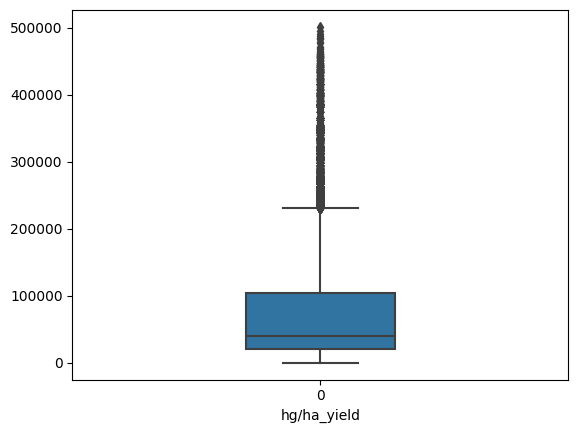

In [34]:
sns.boxplot(crop_dataframe['hg/ha_yield'],width=0.3)

plt.xlabel('hg/ha_yield')
plt.show()

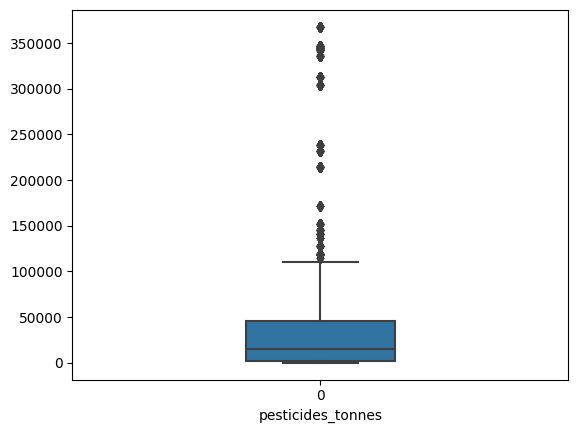

In [35]:
sns.boxplot(crop_dataframe['pesticides_tonnes'],width=0.3)
plt.xlabel('pesticides_tonnes')
plt.show()

###### OUTLIERS IN HG/HA_YIELD

In [36]:
crop_dataframe['hg/ha_yield'].quantile(0.25)

19996.0

In [37]:
crop_dataframe['hg/ha_yield'].quantile(0.75)

104168.0

In [38]:
Q1 = crop_dataframe['hg/ha_yield'].quantile(0.25)
Q3 = crop_dataframe['hg/ha_yield'].quantile(0.75)
IQR = Q3 - Q1

In [39]:
IQR

84172.0

In [40]:
lowerLimit = Q1 - 1.5 * IQR
upperLimit = Q3 + 1.5 * IQR

In [41]:
lowerLimit

-106262.0

In [42]:
upperLimit

230426.0

In [43]:
hg_outliers = crop_dataframe[(crop_dataframe['hg/ha_yield'] < lowerLimit) | (crop_dataframe['hg/ha_yield'] > upperLimit)]

In [44]:
hg_outliers

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
84,84,Albania,Potatoes,2010,231111,1485,1311.17,16.52
88,88,Albania,Potatoes,2011,242211,1485,1302.63,16.45
92,92,Albania,Potatoes,2012,250538,1485,766.25,16.70
96,96,Albania,Potatoes,2013,260110,1485,982.32,17.41
184,184,Algeria,Potatoes,2008,236393,89,11556.12,17.55
...,...,...,...,...,...,...,...,...
25390,27697,United Kingdom,Potatoes,2012,305570,1220,17718.64,10.00
25395,27703,United Kingdom,Potatoes,2013,408993,1220,17673.46,8.76
25396,27704,United Kingdom,Potatoes,2013,408993,1220,17673.46,9.57
25397,27706,United Kingdom,Potatoes,2013,408993,1220,17673.46,8.39


In [45]:
crop_dataframe['hg/ha_yield'] = np.where(crop_dataframe['hg/ha_yield'] > upperLimit,crop_dataframe['hg/ha_yield'].median(),np.where(crop_dataframe['hg/ha_yield'] < lowerLimit,crop_dataframe['hg/ha_yield'].median(),crop_dataframe['hg/ha_yield']))


In [46]:
hg_outliers = crop_dataframe[(crop_dataframe['hg/ha_yield'] < lowerLimit) | (crop_dataframe['hg/ha_yield'] > upperLimit)]
hg_outliers

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp


In [47]:
crop_dataframe.skew()

index                            0.016917
Year                             0.010825
hg/ha_yield                      1.395893
average_rain_fall_mm_per_year    0.859046
pesticides_tonnes                3.637479
avg_temp                        -0.707789
dtype: float64

In [48]:
crop_dataframe.head()

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613.0,1485,121.0,16.37
1,1,Albania,Potatoes,1990,66667.0,1485,121.0,16.37
2,2,Albania,"Rice, paddy",1990,23333.0,1485,121.0,16.37
3,3,Albania,Sorghum,1990,12500.0,1485,121.0,16.37
4,4,Albania,Soybeans,1990,7000.0,1485,121.0,16.37


###### OUTLIERS IN PESTICIDES_TONNES

In [49]:
crop_dataframe['pesticides_tonnes'].quantile(0.25)

1597.0

In [50]:
crop_dataframe['pesticides_tonnes'].quantile(0.75)

45620.0

In [51]:
Q1 = crop_dataframe['pesticides_tonnes'].quantile(0.25)
Q3 = crop_dataframe['pesticides_tonnes'].quantile(0.75)
IQR = Q3 - Q1

In [52]:
IQR

44023.0

In [53]:
lowerLimit = Q1 - 1.5 * IQR
upperLimit = Q3 + 1.5 * IQR

In [54]:
lowerLimit

-64437.5

In [55]:
upperLimit

111654.5

In [56]:
pest_outliers = crop_dataframe[(crop_dataframe['pesticides_tonnes'] < lowerLimit) | (crop_dataframe['pesticides_tonnes'] > upperLimit)]
pest_outliers

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
713,713,Argentina,Cassava,2012,100000.0,591,136185.08,18.18
714,714,Argentina,Cassava,2012,100000.0,591,136185.08,18.43
715,715,Argentina,Maize,2012,57346.0,591,136185.08,18.18
716,716,Argentina,Maize,2012,57346.0,591,136185.08,18.43
717,717,Argentina,Potatoes,2012,39530.0,591,136185.08,18.18
...,...,...,...,...,...,...,...,...
8238,8808,France,Potatoes,1999,39530.0,867,114695.00,11.83
8239,8809,France,"Rice, paddy",1999,60915.0,867,114695.00,11.83
8240,8810,France,Sorghum,1999,62061.0,867,114695.00,11.83
8241,8811,France,Soybeans,1999,26622.0,867,114695.00,11.83


In [57]:
crop_dataframe['pesticides_tonnes'] = np.where(crop_dataframe['pesticides_tonnes'] > upperLimit, 
                                         crop_dataframe['pesticides_tonnes'].median(), 
                                         np.where(crop_dataframe['pesticides_tonnes'] < lowerLimit,crop_dataframe['pesticides_tonnes'].median(),crop_dataframe['pesticides_tonnes']))

In [58]:
pest_outliers = crop_dataframe[(crop_dataframe['pesticides_tonnes'] < lowerLimit) | (crop_dataframe['pesticides_tonnes'] > upperLimit)]

pest_outliers

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp


In [59]:
crop_dataframe.head(714)

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613.0,1485,121.00,16.37
1,1,Albania,Potatoes,1990,66667.0,1485,121.00,16.37
2,2,Albania,"Rice, paddy",1990,23333.0,1485,121.00,16.37
3,3,Albania,Sorghum,1990,12500.0,1485,121.00,16.37
4,4,Albania,Soybeans,1990,7000.0,1485,121.00,16.37
...,...,...,...,...,...,...,...,...
709,709,Argentina,Sweet potatoes,2011,148754.0,591,100424.62,17.58
710,710,Argentina,Sweet potatoes,2011,148754.0,591,100424.62,17.93
711,711,Argentina,Wheat,2011,35063.0,591,100424.62,17.58
712,712,Argentina,Wheat,2011,35063.0,591,100424.62,17.93


In [60]:
crop_dataframe.skew()

index                            0.016917
Year                             0.010825
hg/ha_yield                      1.395893
average_rain_fall_mm_per_year    0.859046
pesticides_tonnes                1.049775
avg_temp                        -0.707789
dtype: float64

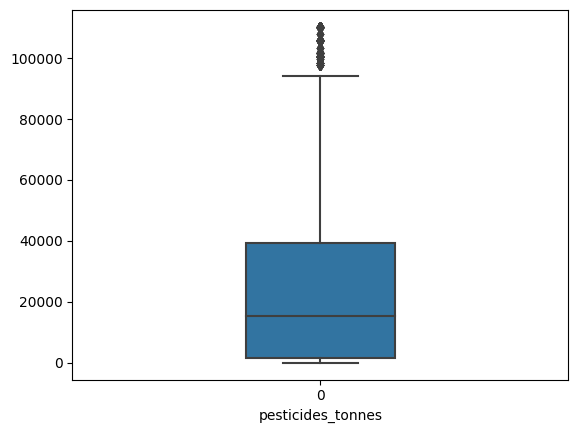

In [61]:
sns.boxplot(crop_dataframe['pesticides_tonnes'],width=0.3)
plt.xlabel('pesticides_tonnes')
plt.show()

In [62]:
crop_summary = pd.pivot_table(crop_dataframe,index=['Item'],aggfunc='mean')
crop_summary

,Year,average_rain_fall_mm_per_year,avg_temp,hg/ha_yield,index,pesticides_tonnes
Item,,,,,,
Cassava,2001.455797,1499.553203,24.287898,95024.937004,13115.475384,23469.342827
Maize,2001.566423,1092.824529,19.752186,37139.320345,14107.770136,22439.219482
Plantains and others,2001.507194,1853.928058,24.243543,87000.591727,12671.944245,7562.274442
Potatoes,2001.592770,1051.516178,18.824684,113287.101618,14563.671638,22147.484770
"Rice, paddy",2001.483339,1188.624717,21.180162,41296.028470,14475.325785,24567.837535
Sorghum,2001.666787,1008.509747,21.285715,19099.774729,14223.720939,23200.912249
Soybeans,2001.581293,1112.565306,19.438605,16992.190136,14140.659184,27944.487701
Sweet potatoes,2001.500193,1239.661010,22.181693,96585.212881,13959.053220,25101.756494
Wheat,2001.562306,939.018649,17.853018,30125.681266,14629.871715,24548.608974


In [63]:
crop_dataframe.groupby(['Area','Item'])['hg/ha_yield'].sum().nsmallest(15)

Area        Item    
Malaysia    Soybeans     3333.0
Tajikistan  Soybeans    18835.0
Albania     Sorghum     22914.0
Sudan       Sorghum     23742.0
Angola      Sorghum     38048.0
Azerbaijan  Sorghum     39890.0
Botswana    Maize       54053.0
Angola      Soybeans    55062.0
Niger       Sorghum     59637.0
Namibia     Sorghum     61740.0
Sudan       Maize       65262.0
            Wheat       73662.0
            Yams        81580.0
Malawi      Soybeans    87339.0
Zimbabwe    Sorghum     88894.0
Name: hg/ha_yield, dtype: float64

In [64]:
crop_dataframe.groupby(['Area','Item'])['hg/ha_yield'].sum().nlargest(15)

Area       Item          
India      Potatoes          77126500.0
           Sweet potatoes    37169811.0
Mexico     Sweet potatoes    31148282.0
Brazil     Cassava           27410576.0
           Potatoes          26692747.0
India      Cassava           26022597.0
Brazil     Sweet potatoes    23014103.0
Japan      Yams              22083055.0
Pakistan   Potatoes          21979836.0
Indonesia  Potatoes          21231637.0
           Cassava           20320674.0
Brazil     Yams              19109808.0
Mexico     Cassava           18758133.0
           Potatoes          16787196.0
Canada     Potatoes          15685386.0
Name: hg/ha_yield, dtype: float64

In [65]:
#No.of DIFFERENT CROPS
crop_dataframe.groupby('Item').count()

,index,Area,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
Item,,,,,,,
Cassava,1889,1889,1889,1889,1889,1889,1889
Maize,3824,3824,3824,3824,3824,3824,3824
Plantains and others,556,556,556,556,556,556,556
Potatoes,3956,3956,3956,3956,3956,3956,3956
"Rice, paddy",3091,3091,3091,3091,3091,3091,3091
Sorghum,2770,2770,2770,2770,2770,2770,2770
Soybeans,2940,2940,2940,2940,2940,2940,2940
Sweet potatoes,2593,2593,2593,2593,2593,2593,2593
Wheat,3539,3539,3539,3539,3539,3539,3539


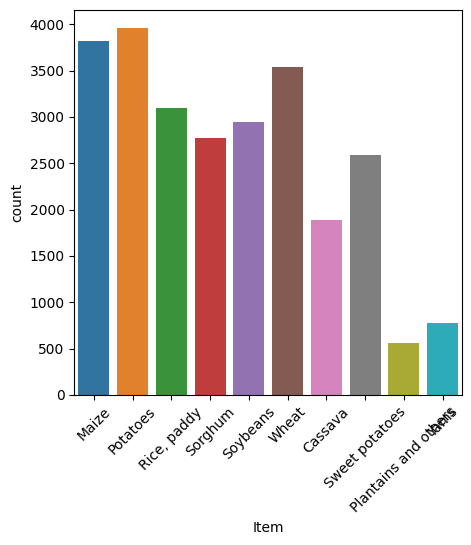

In [66]:
plt.figure(figsize=(5,5))
sns.countplot(data = crop_dataframe, x = "Item")
plt.xticks(rotation=45)
plt.show()

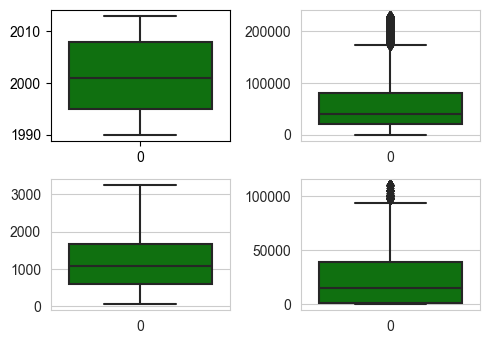

In [67]:
column_values = crop_dataframe.columns.values[3:]
plt.figure(figsize=(5,5))
for i in range(0,4):
    plt.subplot(3,2,i+1)
    sns.set_style('whitegrid')
    sns.boxplot(crop_dataframe[column_values[i]],color='green',orient='v')
    plt.tight_layout()

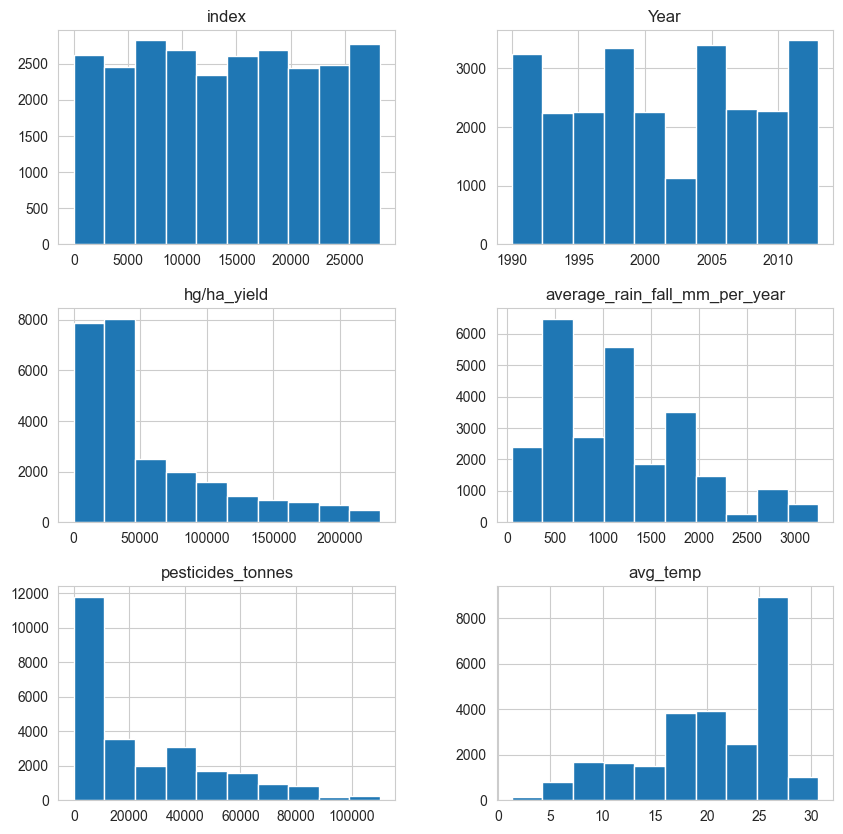

In [68]:
crop_dataframe.hist(figsize=(10,10))
plt.show()

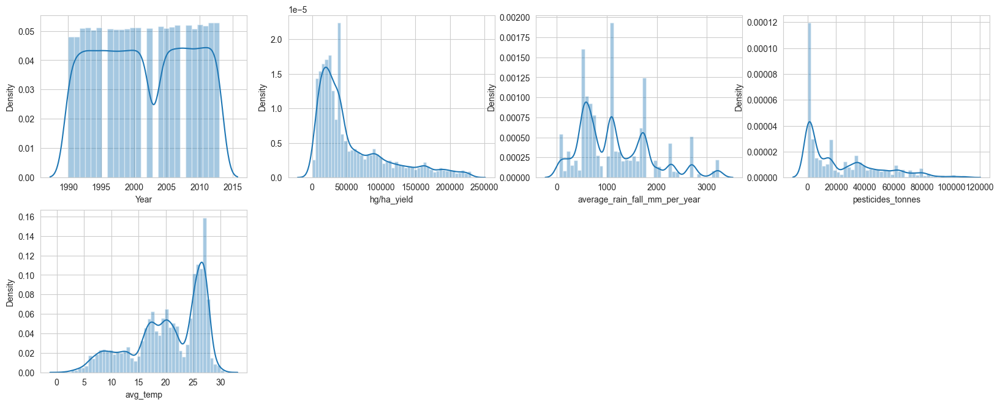

In [69]:
#distribution plot
plt.figure(figsize=(20,20))
for i in range(0,len(column_values)):
    plt.subplot(5,4,i+1)
    sns.distplot(crop_dataframe[column_values[i]],kde=True) 

In [70]:
fig = px.scatter(crop_dataframe, x="Area", y="avg_temp", color="Item", hover_data=['Item','Year','pesticides_tonnes'])
fig.show()

In [71]:
fig = px.pie(crop_dataframe, values="average_rain_fall_mm_per_year", names="Item")
fig.update_layout(title="Average Rainfall For Crop", title_x = 0.45)
fig.show()

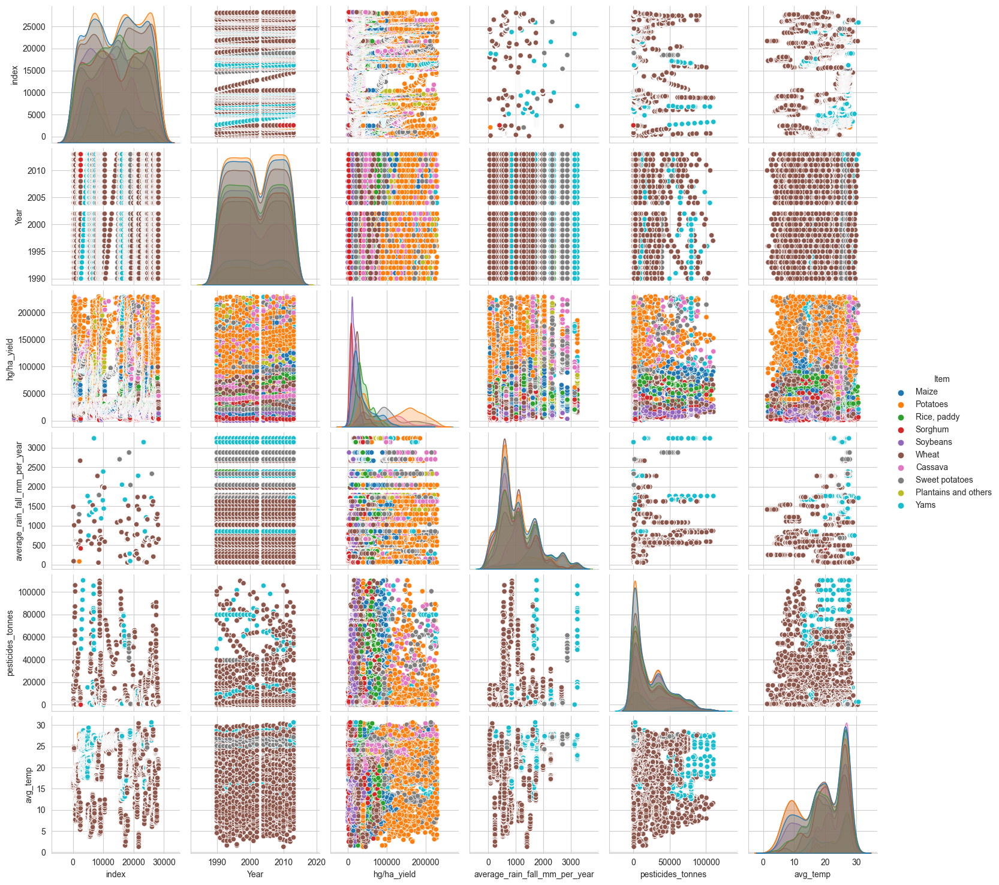

In [72]:
sns.pairplot(crop_dataframe,hue = 'Item')

<AxesSubplot: >

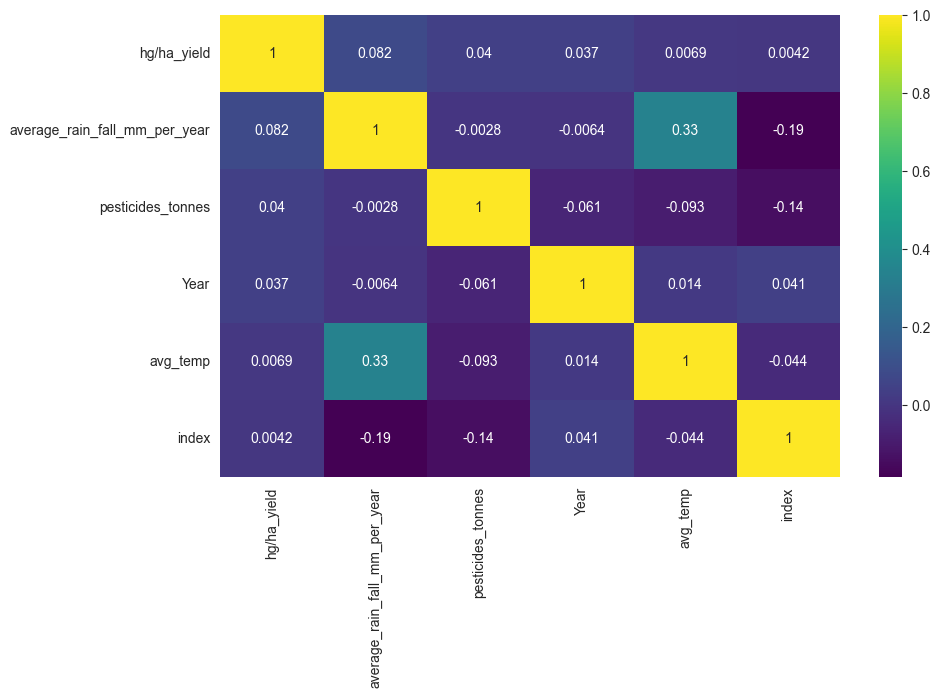

In [73]:
#correlation matrix
k = 7 #number of variables considered
cols = crop_dataframe.corr().nlargest(k, 'hg/ha_yield')['hg/ha_yield'].index
cm = crop_dataframe[cols].corr()
plt.figure(figsize=(10,6))
sns.heatmap(cm, annot=True, cmap = 'viridis')

###### BINNING

In [74]:
def append_values(value):
    if(value >= 1990 and value <= 2000):
        year_range = "old"
    elif(value >= 2001 and value <= 2010):
        year_range = "medium"
    else:
        year_range = "new"
    return year_range
        

In [75]:
concat_list=[]
for i in range(len(crop_dataframe)):
    value = crop_dataframe.iloc[i]['Year']
    value_cat = append_values(value)
    concat_list.append(value_cat)
crop_dataframe['Year_range'] = concat_list
    
    

In [76]:
crop_dataframe.head()

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Year_range
0,0,Albania,Maize,1990,36613.0,1485,121.0,16.37,old
1,1,Albania,Potatoes,1990,66667.0,1485,121.0,16.37,old
2,2,Albania,"Rice, paddy",1990,23333.0,1485,121.0,16.37,old
3,3,Albania,Sorghum,1990,12500.0,1485,121.0,16.37,old
4,4,Albania,Soybeans,1990,7000.0,1485,121.0,16.37,old


In [77]:
crop_dataframe.tail()

,index,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Year_range
25927,28237,Zimbabwe,"Rice, paddy",2013,22581.0,657,2550.07,19.76,new
25928,28238,Zimbabwe,Sorghum,2013,3066.0,657,2550.07,19.76,new
25929,28239,Zimbabwe,Soybeans,2013,13142.0,657,2550.07,19.76,new
25930,28240,Zimbabwe,Sweet potatoes,2013,22222.0,657,2550.07,19.76,new
25931,28241,Zimbabwe,Wheat,2013,22888.0,657,2550.07,19.76,new


## PHASE 2 - ML MODELS

### Libraries required for Phase 2

In [78]:
import sklearn
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from pathlib import Path

In [79]:
from sklearn.metrics import r2_score
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import svm
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from yellowbrick.regressor import PredictionError, ResidualsPlot
from sklearn.preprocessing import MinMaxScaler

In [80]:
#renaming the columns in the dataframe
crop_dataframe.columns=['Index','Area','Item','Year','yield_value','avg_rainfall','pest_tonnes','avg_temp','year_range']


In [81]:
crop_dataframe.head()

,Index,Area,Item,Year,yield_value,avg_rainfall,pest_tonnes,avg_temp,year_range
0,0,Albania,Maize,1990,36613.0,1485,121.0,16.37,old
1,1,Albania,Potatoes,1990,66667.0,1485,121.0,16.37,old
2,2,Albania,"Rice, paddy",1990,23333.0,1485,121.0,16.37,old
3,3,Albania,Sorghum,1990,12500.0,1485,121.0,16.37,old
4,4,Albania,Soybeans,1990,7000.0,1485,121.0,16.37,old


In [82]:
crop_dataframe = crop_dataframe.reset_index(drop=True)
crop_dataframe

,Index,Area,Item,Year,yield_value,avg_rainfall,pest_tonnes,avg_temp,year_range
0,0,Albania,Maize,1990,36613.0,1485,121.00,16.37,old
1,1,Albania,Potatoes,1990,66667.0,1485,121.00,16.37,old
2,2,Albania,"Rice, paddy",1990,23333.0,1485,121.00,16.37,old
3,3,Albania,Sorghum,1990,12500.0,1485,121.00,16.37,old
4,4,Albania,Soybeans,1990,7000.0,1485,121.00,16.37,old
...,...,...,...,...,...,...,...,...,...
25927,28237,Zimbabwe,"Rice, paddy",2013,22581.0,657,2550.07,19.76,new
25928,28238,Zimbabwe,Sorghum,2013,3066.0,657,2550.07,19.76,new
25929,28239,Zimbabwe,Soybeans,2013,13142.0,657,2550.07,19.76,new
25930,28240,Zimbabwe,Sweet potatoes,2013,22222.0,657,2550.07,19.76,new


In [83]:
#storing the values in the csv file
path = Path("./crop_dataframe.csv")
crop_dataframe.to_csv(path)

In [84]:
#ONE HOT ENCODING
crop_dataframe_onehot = pd.get_dummies(crop_dataframe, columns=['Area',"Item"], prefix = ['Country',"Item"])
#crop_dataframe_onehot.head()
crop_dataframe = crop_dataframe_onehot.loc[:, crop_dataframe_onehot.columns != 'yield_value']
label = crop_dataframe_onehot['yield_value']
crop_dataframe.head()

,Index,Year,avg_rainfall,pest_tonnes,avg_temp,year_range,Country_Albania,Country_Algeria,Country_Angola,Country_Argentina,...,Item_Cassava,Item_Maize,Item_Plantains and others,Item_Potatoes,"Item_Rice, paddy",Item_Sorghum,Item_Soybeans,Item_Sweet potatoes,Item_Wheat,Item_Yams
0,0,1990,1485,121.0,16.37,old,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,1,1990,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,2,1990,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,3,1990,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,4,1990,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [85]:
#storing the encoded file into csv 
path = Path("./crop_dataframe_encoded.csv")
crop_dataframe.to_csv(path)

In [86]:
crop_dataframe = crop_dataframe.drop(['year_range'],axis = 1)

In [87]:
crop_dataframe['Year'].max()

2013

### TRAINING THE DATASET

In [88]:
crop_train_data, crop_test_data, crop_train_labels, crop_test_labels = train_test_split(crop_dataframe, 
                                                                                        label, 
                                                                                        test_size=0.20, 
                                                                                        random_state=30)


In [89]:
print(crop_train_data.shape, crop_train_labels.shape)
print(crop_test_data.shape, crop_test_labels.shape)

(20745, 116) (20745,)
(5187, 116) (5187,)


## REGRESSION MODELS

### LINEAR REGRESSION

In [90]:
model = LinearRegression()
fit = model.fit(crop_train_data,crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2 = r2_score(crop_test_labels, y_pred)
print('r2 score: ',r2)

r2 score:  0.5549816940290478


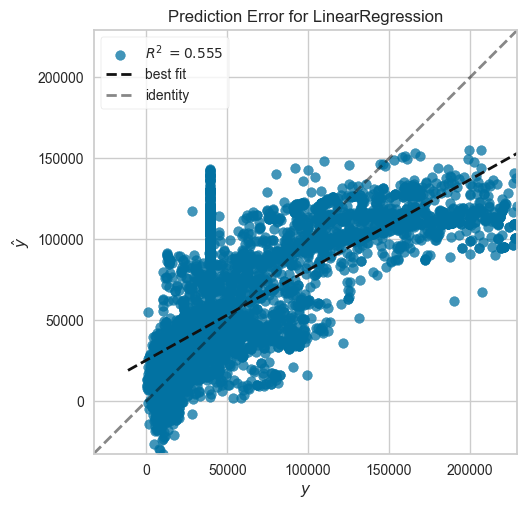

In [91]:
linear_vis = PredictionError(model)
linear_vis.fit(crop_train_data, crop_train_labels)  
linear_vis.score(crop_test_data, crop_test_labels)  
linear_vis.poof()
plt.show()

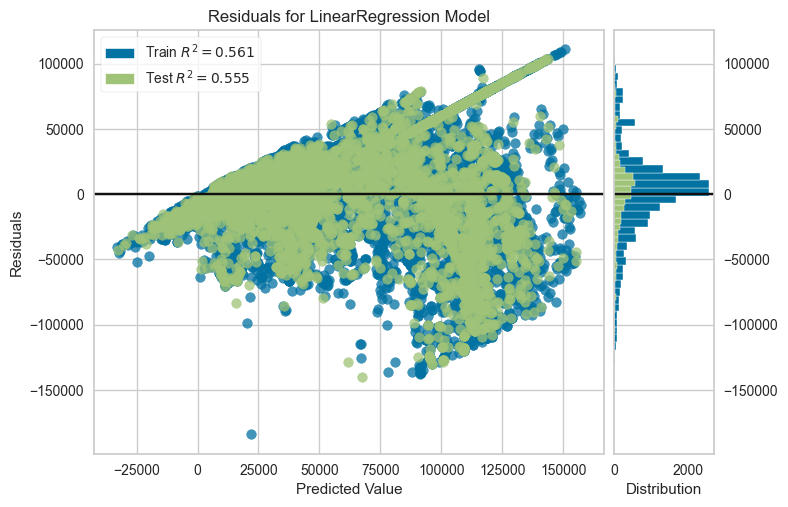

In [92]:
linear_vis = ResidualsPlot(model)
linear_vis.fit(crop_train_data, crop_train_labels)  
linear_vis.score(crop_test_data, crop_test_labels)   
linear_vis.poof()
plt.show()

### QUANTILE REGRESSION

In [93]:
!pip install statsmodels

In [94]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
model = smf.quantreg('Year ~ avg_rainfall', crop_dataframe).fit(q=0.9)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                         QuantReg Regression Results                          
==============================================================================
Dep. Variable:                   Year   Pseudo R-squared:           -1.777e-08
Model:                       QuantReg   Bandwidth:                      0.9429
Method:                 Least Squares   Sparsity:                        28.47
Date:                Fri, 02 Dec 2022   No. Observations:                25932
Time:                        18:44:54   Df Residuals:                    25930
                                        Df Model:                            1
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     2011.0000      0.114   1.77e+04      0.000    2010.777    2011.223
avg_rainfall -4.876e-10   8.38e-05  -5.82e-06      1.000      -0.000       0.000
================================================================================

The condition number is large, 2.55e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0, 0.5, 'Year')

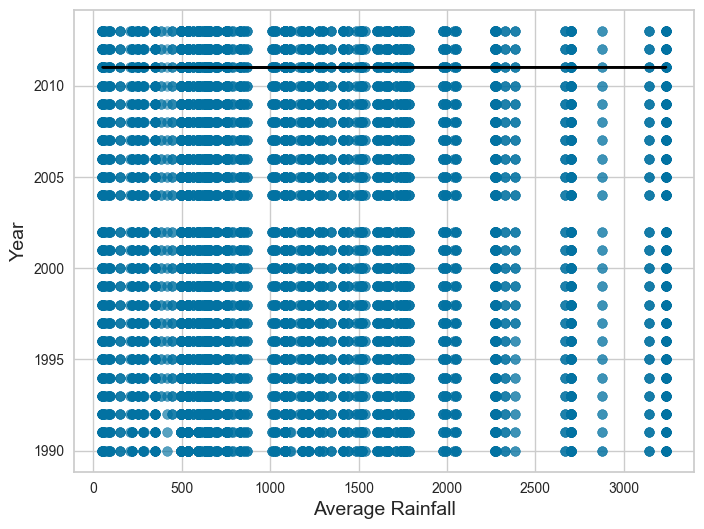

In [95]:
fig, ax = plt.subplots(figsize=(8, 6))

#get y values
get_y = lambda a, b: a + b * crop_dataframe['avg_rainfall']
y = get_y(model.params['Intercept'], model.params['avg_rainfall'])

#plot data points with quantile regression equation overlaid
ax.plot(crop_dataframe['avg_rainfall'], y, color='black')
ax.scatter(crop_dataframe['avg_rainfall'], crop_dataframe['Year'], alpha=.3)
ax.set_xlabel('Average Rainfall', fontsize=14)
ax.set_ylabel('Year', fontsize=14)

### RIDGE REGRESSION

In [96]:
model = linear_model.Ridge(alpha=0.05432)
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2 = r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2)
#print('accuracy: ',r2*100)

r2 score:  0.5549314959249452


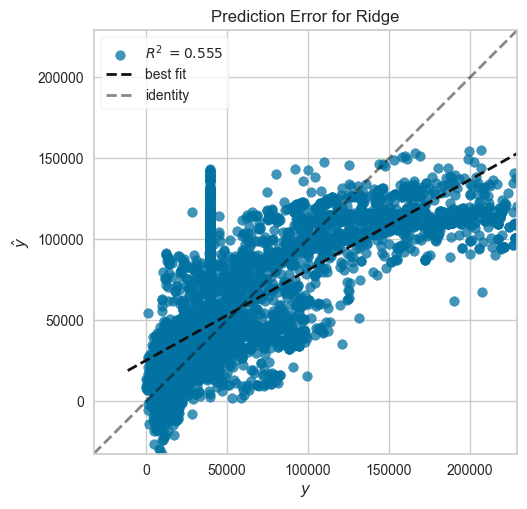

In [97]:
ridge_vis = PredictionError(model)
ridge_vis.fit(crop_train_data, crop_train_labels)  
ridge_vis.score(crop_test_data, crop_test_labels)  
ridge_vis.poof()
plt.show()

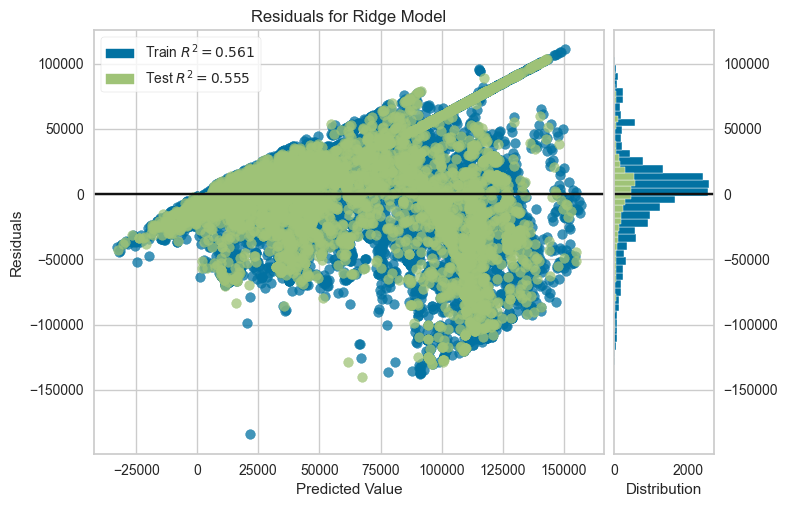

In [98]:
ridge_vis = ResidualsPlot(model)
ridge_vis.fit(crop_train_data, crop_train_labels)  
ridge_vis.score(crop_test_data, crop_test_labels)   
ridge_vis.poof()
plt.show()

### LASSO REGRESSION

In [99]:
model = Lasso(alpha = 0.4)
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2_lasso = r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2_lasso)
#print('accuracy: ',r2_lasso*100)

r2 score:  0.5547281341771906


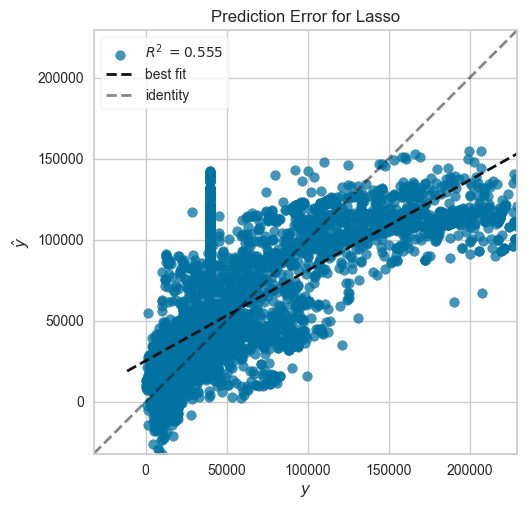

In [100]:
lasso_vis = PredictionError(model)
lasso_vis.fit(crop_train_data, crop_train_labels)  
lasso_vis.score(crop_test_data, crop_test_labels)  
lasso_vis.poof()
plt.show()

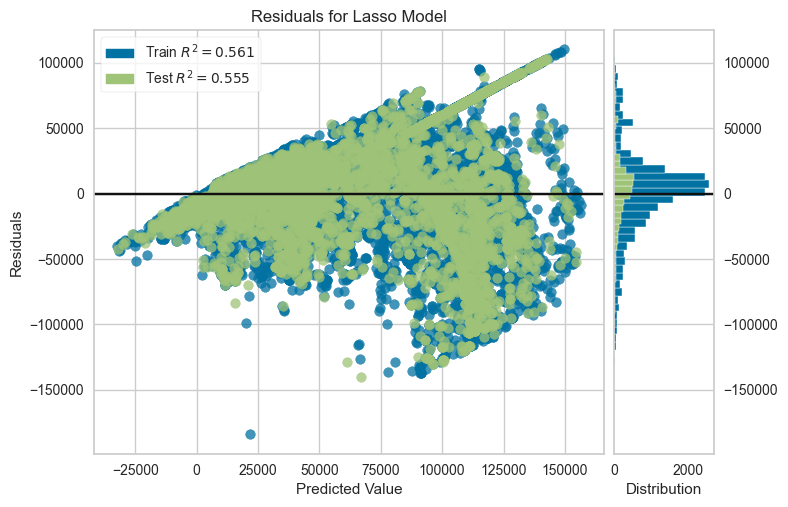

In [101]:
lasso_vis = ResidualsPlot(model)
lasso_vis.fit(crop_train_data, crop_train_labels)  
lasso_vis.score(crop_test_data, crop_test_labels)   
lasso_vis.poof()
plt.show()

### ELASTIC NET REGRESSION

In [102]:
model_enet = ElasticNet(random_state=700)
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2_enet = r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2_enet)
print('accuracy: ',r2_enet*100)

r2 score:  0.5547281341771906
accuracy:  55.47281341771906


### RANDOM FOREST

In [103]:
seed = 9000
model = RandomForestRegressor(n_estimators=400, max_depth=3, random_state=seed)
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2 = r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2)
#print('accuracy: ',r2*100)

r2 score:  0.45259090544312786


### SUPPORT VECTOR REGRESSOR

In [104]:
model = svm.SVR()
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2 = r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2)
#print('accuracy: ',r2*100)

r2 score:  -0.11614379140084363


### DECISION TREE

In [105]:
model = DecisionTreeRegressor(max_depth=18)
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2 = r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2)
#print('accuracy: ',r2*100)

r2 score:  0.9127161580376324


### GRADIENT BOOSTING 

In [106]:
model = GradientBoostingRegressor(n_estimators=200, max_depth=5, random_state=3000)
fit = model.fit(crop_train_data, crop_train_labels)
y_pred = fit.predict(crop_test_data)
r2=r2_score(crop_test_labels,y_pred)
print('r2 score: ',r2)
#print('accuracy: ',r2*100)

r2 score:  0.8489711228506749


### VISUALIZATION AND PREDICTION

#### As we can see we got the highest accuracy for decision tree models

#### creating test data as columns from dataset to predict the values

In [107]:
crop_dataframe_onehot = crop_dataframe_onehot.drop(['Year'], axis=1)
crop_dataframe_onehot.head()

,Index,yield_value,avg_rainfall,pest_tonnes,avg_temp,year_range,Country_Albania,Country_Algeria,Country_Angola,Country_Argentina,...,Item_Cassava,Item_Maize,Item_Plantains and others,Item_Potatoes,"Item_Rice, paddy",Item_Sorghum,Item_Soybeans,Item_Sweet potatoes,Item_Wheat,Item_Yams
0,0,36613.0,1485,121.0,16.37,old,1,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,1,66667.0,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,2,23333.0,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,3,12500.0,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,4,7000.0,1485,121.0,16.37,old,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [108]:
crop_test_df = pd.DataFrame(crop_test_data,columns = crop_dataframe_onehot.loc[:, crop_dataframe_onehot.columns != 'yield_value'].columns) 
country = crop_test_df[[col for col in crop_test_df.columns if 'Country' in col]].stack()[crop_test_df[[col for col in crop_test_df.columns if 'Country' in col]].stack()>0]
country_list = list(pd.DataFrame(country).index.get_level_values(1))
countries=[i.split("_")[1] for i in country_list]
item = crop_test_df[[col for col in crop_test_df.columns if 'Item' in col]].stack()[crop_test_df[[col for col in crop_test_df.columns if 'Item' in col]].stack()>0]
itemlist=list(pd.DataFrame(item).index.get_level_values(1))
items=[i.split("_")[1] for i in itemlist]

In [109]:
crop_test_df.head()

,Index,avg_rainfall,pest_tonnes,avg_temp,year_range,Country_Albania,Country_Algeria,Country_Angola,Country_Argentina,Country_Armenia,...,Item_Cassava,Item_Maize,Item_Plantains and others,Item_Potatoes,"Item_Rice, paddy",Item_Sorghum,Item_Soybeans,Item_Sweet potatoes,Item_Wheat,Item_Yams
23844,26108,1537,1644.30,7.96,NaN,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
11395,12279,1083,44957.52,27.08,NaN,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
12562,13657,1083,14485.33,25.30,NaN,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
23194,25458,636,40727.00,12.52,NaN,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
14985,16240,1668,79821.18,15.38,NaN,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [110]:
crop_test_df.drop([col for col in crop_test_df.columns if 'Item' in col],axis=1,inplace=True)
crop_test_df.drop([col for col in crop_test_df.columns if 'Country' in col],axis=1,inplace=True)
crop_test_df.head()

,Index,avg_rainfall,pest_tonnes,avg_temp,year_range
23844,26108,1537,1644.30,7.96,NaN
11395,12279,1083,44957.52,27.08,NaN
12562,13657,1083,14485.33,25.30,NaN
23194,25458,636,40727.00,12.52,NaN
14985,16240,1668,79821.18,15.38,NaN


In [111]:
crop_test_df['Country'] = countries
crop_test_df['Item'] = items
crop_test_df.head()

,Index,avg_rainfall,pest_tonnes,avg_temp,year_range,Country,Item
23844,26108,1537,1644.30,7.96,NaN,Switzerland,Soybeans
11395,12279,1083,44957.52,27.08,NaN,India,Cassava
12562,13657,1083,14485.33,25.30,NaN,India,Wheat
23194,25458,636,40727.00,12.52,NaN,Spain,"Rice, paddy"
14985,16240,1668,79821.18,15.38,NaN,Japan,"Rice, paddy"


In [112]:
def evaluation_metrics(actual, predicted):
    mae = mean_absolute_error(actual, predicted)
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mean_squared_error(actual, predicted))
    return mae,mse,rmse

In [113]:
def scatter_plots():
    fig, ax = plt.subplots() 
    ax.scatter(crop_test_df["yield_actual"], crop_test_df["yield_predicted"],edgecolors=(0, 0, 0))
    ax.set_xlabel('Actual')
    ax.set_ylabel('Predicted')
    ax.set_title("Actual vs Predicted")
    plt.show()

In [114]:
def bar_plot_imp(n):
    important_features= {'imp':model.feature_importances_,'names':crop_dataframe_onehot.columns[crop_dataframe_onehot.columns!="yield_value"]}
    imp_dataframe=pd.DataFrame.from_dict(important_features)
    imp_dataframe=imp_dataframe.nlargest(n, 'imp')
    plt = px.bar(imp_dataframe, x="imp",y="names",color="imp",text_auto=True)
    plt.show()
    

In [115]:
def box_plot(value):
    fig = px.box(crop_test_df, x = "Item" , y = value, color = "Item" );
    fig.update_layout(title = "Box plot for yield", title_x=0.5)
    fig.show()
    

### DECISION TREE EVALUATION AND VISUALIZATION

In [116]:
algo = DecisionTreeRegressor()
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
predicted = crop_test_df["yield_predicted"] 
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
actual = crop_test_df["yield_actual"]
crop_test_group = crop_test_df.groupby("Item")
crop_test_group.apply(lambda x: r2_score(x.yield_actual,x.yield_predicted))

Item
Cassava                 0.848635
Maize                   0.941037
Plantains and others    0.607038
Potatoes                0.752024
Rice, paddy             0.952585
Sorghum                 0.872833
Soybeans                0.921607
Sweet potatoes          0.902011
Wheat                   0.961194
Yams                    0.768801
dtype: float64

In [117]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------DECISION TREE-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------DECISION TREE-------
Mean Squared Error     :  251828974.06207827
Mean Absolute Error    :  3867.3032581453635
Root Mean Squared Error:  15869.12014139657


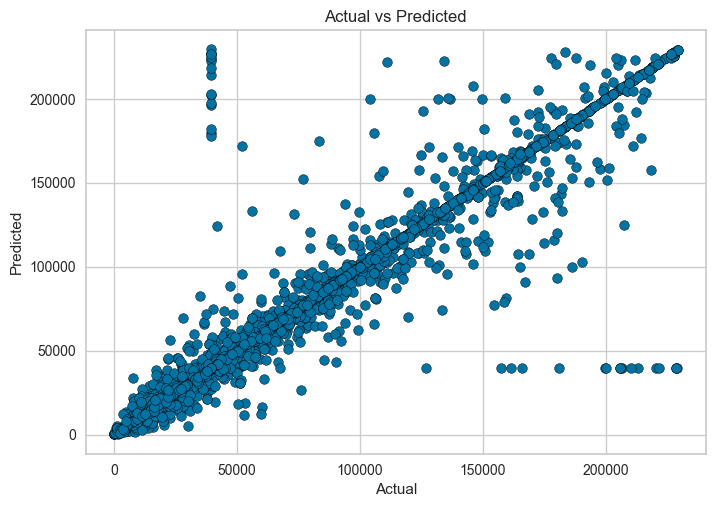

In [118]:
scatter_plots()

In [119]:
bar_plot_imp(5)

In [120]:

box_plot("yield_predicted")


In [121]:
box_plot("yield_actual")


### GRADIENT BOOSTING EVALUATION AND VISUALIZATION

In [122]:
algo = GradientBoostingRegressor(n_estimators=200, max_depth=2, random_state=50)
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
crop_test_group = crop_test_df.groupby("Item")
crop_test_group.apply(lambda x: r2_score(x.yield_actual,x.yield_predicted))
predicted = crop_test_df["yield_predicted"] 
actual = crop_test_df["yield_actual"]

In [123]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------GRADIENT BOOSTING-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------GRADIENT BOOSTING-------
Mean Squared Error     :  984715054.6710349
Mean Absolute Error    :  21632.15005411425
Root Mean Squared Error:  31380.16976804037


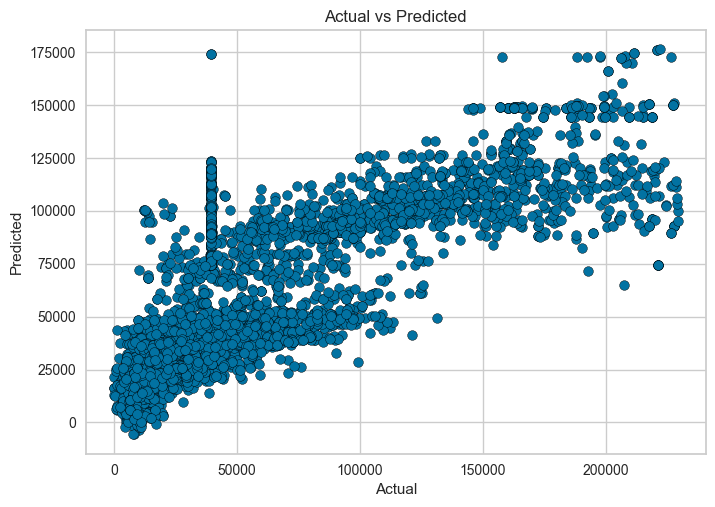

In [124]:
scatter_plots()

### RANDOM FOREST EVALUATION AND VISUALIZATION

In [125]:
algo = RandomForestRegressor(n_estimators=400, max_depth=3, random_state=100)
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
crop_test_group = crop_test_df.groupby("Item")
crop_test_group.apply(lambda x: r2_score(x.yield_actual,x.yield_predicted))
predicted = crop_test_df["yield_predicted"] 
actual = crop_test_df["yield_actual"]

In [126]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------RANDOM FOREST-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------RANDOM FOREST-------
Mean Squared Error     :  1537226323.515116
Mean Absolute Error    :  28697.644087656423
Root Mean Squared Error:  39207.477903011255


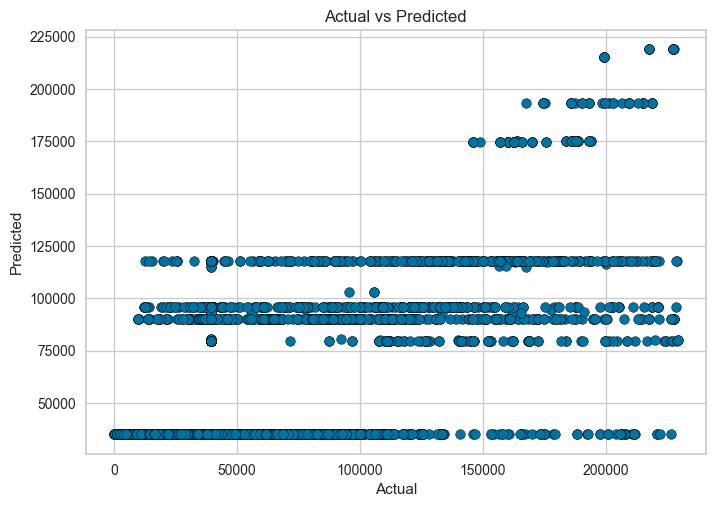

In [127]:
scatter_plots()

### LINEAR REGRESSION EVALUATION AND VISUALIZATION

In [128]:
algo = LinearRegression()
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
predicted = crop_test_df["yield_predicted"] 
actual = crop_test_df["yield_actual"]

In [129]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------LINEAR REGRESSION-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------LINEAR REGRESSION-------
Mean Squared Error     :  1249700127.9538124
Mean Absolute Error    :  24932.14175213236
Root Mean Squared Error:  35351.097973808566


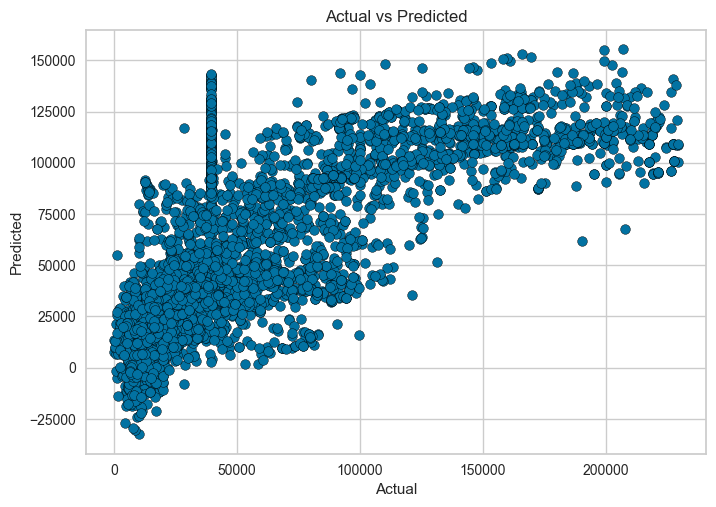

In [130]:
scatter_plots()

In [131]:
fig = px.pie(crop_test_df, values="yield_predicted", names="Item")
fig.update_layout(title = "Predicted Yield For Crop", title_x = 0.45)
fig.show()
fig = px.pie(crop_test_df, values="yield_actual", names="Item")
fig.update_layout(title = "Actual Yield For Crop", title_x = 0.45)
fig.show()

### RIDGE REGRESSION EVALUATION AND VISUALIZATION

In [132]:
algo = linear_model.Ridge()
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
predicted = crop_test_df["yield_predicted"] 
actual = crop_test_df["yield_actual"]

In [133]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------RIDGE REGRESSION-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------RIDGE REGRESSION-------
Mean Squared Error     :  1250775854.2237446
Mean Absolute Error    :  24915.920770874152
Root Mean Squared Error:  35366.30959294092


In [134]:
algo = linear_model.Lasso()
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
predicted = crop_test_df["yield_predicted"] 
actual = crop_test_df["yield_actual"]

In [135]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------LASSO REGRESSION-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------LASSO REGRESSION-------
Mean Squared Error     :  1250946421.987199
Mean Absolute Error    :  24920.292214380894
Root Mean Squared Error:  35368.72095492286


In [136]:
algo = ElasticNet()
model = algo.fit(crop_train_data,crop_train_labels)
crop_test_df["yield_predicted"] = model.predict(crop_test_data)
crop_test_df["yield_actual"] = pd.DataFrame(crop_test_labels)["yield_value"].tolist()
predicted = crop_test_df["yield_predicted"] 
actual = crop_test_df["yield_actual"]

In [137]:
MAE, MSE, RMSE = evaluation_metrics(actual, predicted)
print("--------ELASTIC NET REGRESSION-------")
print("Mean Squared Error     : ", MSE)
print("Mean Absolute Error    : ", MAE)
print("Root Mean Squared Error: ", RMSE)

--------ELASTIC NET REGRESSION-------
Mean Squared Error     :  2306509156.1831374
Mean Absolute Error    :  37832.06132730428
Root Mean Squared Error:  48026.12993135234


# PHASE 3

## SAVING THE BEST MODEL

In [138]:
data = pd.read_csv("crop_dataframe2.csv")
data = pd.DataFrame(data)
label=data['hg/ha_yield']
data = data.drop(['index','Year_range','hg/ha_yield'], axis = 1)


In [139]:
data['Year'].min()

1990

In [140]:
Countries = ['Albania', 'Algeria', 'Angola', 'Argentina', 'Armenia',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Belarus', 'Belgium', 'Botswana', 'Brazil',
       'Bulgaria', 'Burkina Faso', 'Burundi', 'Cameroon', 'Canada',
       'Central African Republic', 'Chile', 'Colombia', 'Croatia',
       'Denmark', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
       'Eritrea', 'Estonia', 'Finland', 'France', 'Germany', 'Ghana',
       'Greece', 'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras',
       'Hungary', 'India', 'Indonesia', 'Iraq', 'Ireland', 'Italy',
       'Jamaica', 'Japan', 'Kazakhstan', 'Kenya', 'Latvia', 'Lebanon',
       'Lesotho', 'Libya', 'Lithuania', 'Madagascar', 'Malawi',
       'Malaysia', 'Mali', 'Mauritania', 'Mauritius', 'Mexico',
       'Montenegro', 'Morocco', 'Mozambique', 'Namibia', 'Nepal',
       'Netherlands', 'New Zealand', 'Nicaragua', 'Niger', 'Norway',
       'Pakistan', 'Papua New Guinea', 'Peru', 'Poland', 'Portugal',
       'Qatar', 'Romania', 'Rwanda', 'Saudi Arabia', 'Senegal',
       'Slovenia', 'South Africa', 'Spain', 'Sri Lanka', 'Sudan',
       'Suriname', 'Sweden', 'Switzerland', 'Tajikistan', 'Thailand',
       'Tunisia', 'Turkey', 'Uganda', 'Ukraine', 'United Kingdom',
       'Uruguay', 'Zambia', 'Zimbabwe']
AreaNumbers, ItemNumbers = {}, {}
for i, j in enumerate(Countries):
    AreaNumbers[j] = i
data['Area'] = data['Area'].replace(AreaNumbers, regex=True)
Items = ['Maize', 'Potatoes', 'Rice, paddy', 'Sorghum', 'Soybeans', 'Wheat',
       'Cassava', 'Sweet potatoes', 'Plantains and others', 'Yams']
for i, j in enumerate(Items):
    ItemNumbers[j] = i
data['Item'] = data['Item'].replace(ItemNumbers, regex=True)


In [158]:
trainData, testData, trainLabels, testLabels = train_test_split(data, label, test_size=0.20, random_state=30)
model = DecisionTreeRegressor(max_depth=18)
fit = model.fit(trainData, trainLabels)
y_pred = fit.predict(testData)
r2 = r2_score(testLabels,y_pred)
print('r2 score: ',r2)

r2 score:  0.8892072548149663


In [143]:
testData.head()

,Area,Item,Year,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
23844,90,4,1997,1537,1644.30,7.96
11395,42,6,2000,1083,44957.52,27.08
12562,42,5,2008,1083,14485.33,25.30
23194,85,2,2002,636,40727.00,12.52
14985,48,2,1991,1668,79821.18,15.38


In [144]:
testLabels.head()

23844    26472
11395    39530
12562    28022
23194    72172
14985    58590
Name: hg/ha_yield, dtype: int64

In [159]:
import streamlit as st
import pickle
import numpy as np
pickle.dump(fit,open('model.pkl','wb'))


model=pickle.load(open('model.pkl','rb'))

#### REFERENCES

https://www.scikit-yb.org/en/latest/

https://seaborn.pydata.org/tut

https://scikit-learn.org/stable/

https://plotly.com/python/
